## Model Interpretability On Emotion Classification

- Partition Explainer for multi-class label

In [51]:
import datasets
import pandas as pd
import transformers

import shap

# load the emotion dataset
dataset = datasets.load_dataset("emotion", split="train")
data = pd.DataFrame({"text": dataset["text"], "emotion": dataset["label"]})

In [52]:
data.head()

,text,emotion
0,i didnt feel humiliated,0
1,i can go from feeling so hopeless to so damned...,0
2,im grabbing a minute to post i feel greedy wrong,3
3,i am ever feeling nostalgic about the fireplac...,2
4,i am feeling grouchy,3


### Six Classes - Joy, sadness, anger, fear, love and surprise.

In [53]:
# load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("nateraw/bert-base-uncased-emotion", use_fast=True)
model = transformers.AutoModelForSequenceClassification.from_pretrained("nateraw/bert-base-uncased-emotion").cuda()

# build a pipeline object to do predictions
pred = transformers.pipeline(
    "text-classification",
    model=model,
    tokenizer=tokenizer,
    device=0,
    top_k=None,
)

Device set to use cuda:0


In [54]:
explainer = shap.Explainer(pred)

In [55]:
shap_values = explainer(data["text"][:3])

In [56]:
data["text"][:3].to_list()

['i didnt feel humiliated',
 'i can go from feeling so hopeless to so damned hopeful just from being around someone who cares and is awake',
 'im grabbing a minute to post i feel greedy wrong']

In [57]:
shap.plots.text(shap_values[0])

In [58]:
shap.plots.text(shap_values[1:3])

In [59]:
shap.plots.text(shap_values[:, :, "anger"])

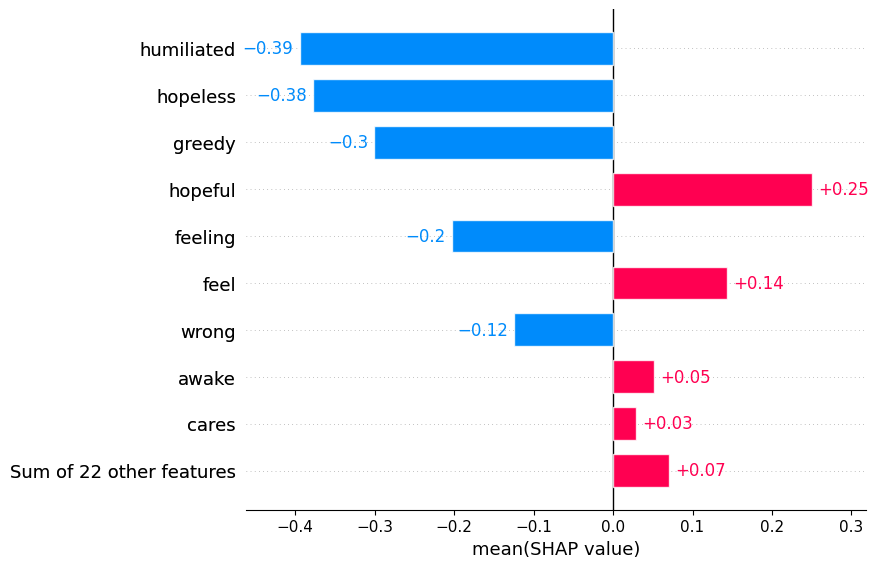

In [60]:
shap.plots.bar(shap_values[:, :, "joy"].mean(0))

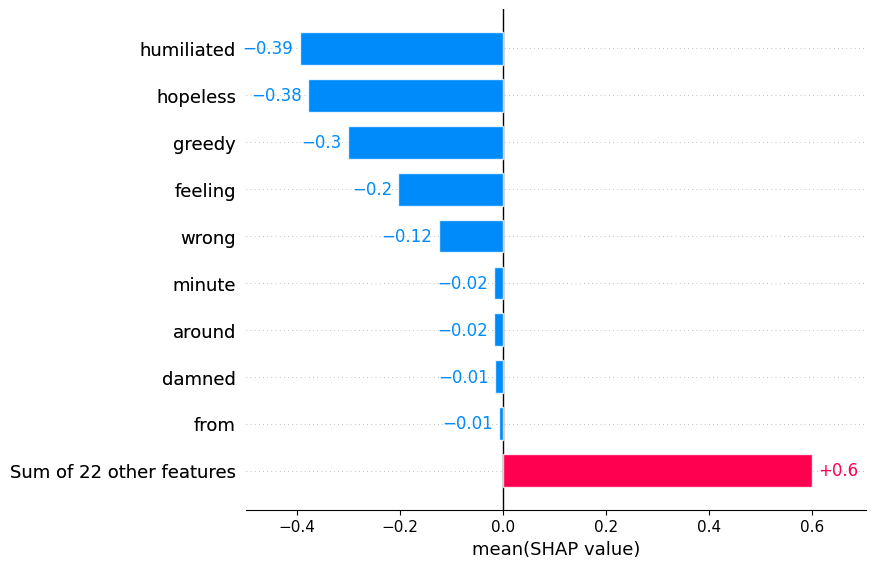

In [61]:
# we can sort the bar chart in decending order
shap.plots.bar(shap_values[:, :, "joy"].mean(0), order=shap.Explanation.argsort)

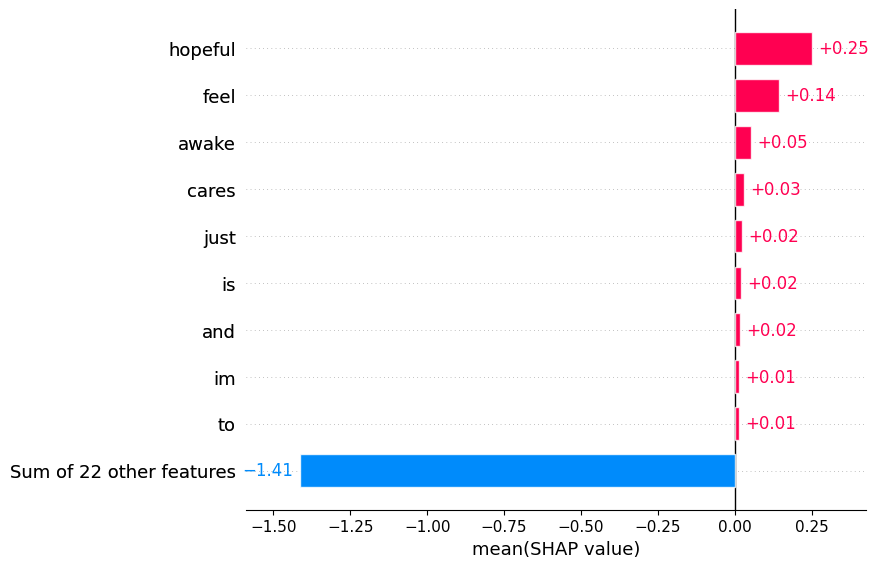

In [62]:
# ...or acending order
shap.plots.bar(shap_values[:, :, "joy"].mean(0), order=shap.Explanation.argsort.flip)

### Scaling to Log Odds 

In [63]:
logit_explainer = shap.Explainer(shap.models.TransformersPipeline(pred, rescale_to_logits=True))

logit_shap_values = logit_explainer(data["text"][:3])
shap.plots.text(logit_shap_values)

### Text-to-Text Generation

In [64]:
from transformers import AutoModelForSeq2SeqLM, AutoTokenizer

import shap

In [65]:
# load the model and tokenizer
tokenizer = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-en-es")
model = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-en-es").cuda()

# define the input sentences we want to translate
data = [
    "Transformers have rapidly become the model of choice for NLP problems, replacing older recurrent neural network models"
]

/home/mayur/.local/lib/python3.10/site-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


In [66]:
# we build an explainer by passing the model we want to explain and
# the tokenizer we want to use to break up the input strings
explainer = shap.Explainer(model, tokenizer)

# explainers are callable, just like models
shap_values = explainer(data, fixed_context=1)

In [67]:
shap.plots.text(shap_values)